Level 1: Data Exploration & Descriptive Analysis

Task 1: Data Exploration and Preprocessing

In [2]:
import numpy as np
import pandas as pd

path = '/content/Dataset .csv'
df = pd.read_csv(path)
print("Total Restaurant: ", len(df))
print("Toatal Rows & Columns: ", df.shape)
df.head(5)


Total Restaurant:  9551
Toatal Rows & Columns:  (9551, 21)


,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Switch to order menu 

In [4]:
df.describe()

,Restaurant ID,Country Code,Longitude,Latitude,Average Cost for two,Price range,Aggregate rating,Votes
count,9.551000e+03,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000
mean,9.051128e+06,18.365616,64.126574,25.854381,1199.210763,1.804837,2.666370,156.909748
std,8.791521e+06,56.750546,41.467058,11.007935,16121.183073,0.905609,1.516378,430.169145
min,5.300000e+01,1.000000,-157.948486,-41.330428,0.000000,1.000000,0.000000,0.000000
25%,3.019625e+05,1.000000,77.081343,28.478713,250.000000,1.000000,2.500000,5.000000
50%,6.004089e+06,1.000000,77.191964,28.570469,400.000000,2.000000,3.200000,31.000000
75%,1.835229e+07,1.000000,77.282006,28.642758,700.000000,2.000000,3.700000,131.000000
max,1.850065e+07,216.000000,174.832089,55.976980,800000.000000,4.000000,4.900000,10934.000000


In [5]:
df.dtypes

,0
Restaurant ID,int64
Restaurant Name,object
Country Code,int64
City,object
Address,object
Locality,object
Locality Verbose,object
Longitude,float64
Latitude,float64
Cuisines,object


Data Cleaning

In [6]:
df.isnull().sum()

,0
Restaurant ID,0
Restaurant Name,0
Country Code,0
City,0
Address,0
Locality,0
Locality Verbose,0
Longitude,0
Latitude,0
Cuisines,9


In [7]:
# Clean Columns
def clean_dataframe(df):
  def clean_column(col):
    if col.dtype == 'object':
      # Strip whitespace and replace empty strings with NaN
      return col.str.strip().replace('', np.nan)
    elif pd.api.types.is_numeric_dtype(col):
      # Replace infinite values with NaN
      return col.replace([np.inf, -np.inf], np.nan)
    else:
      return col  # Leave other types untouched (e.g., datetime, bool)

  return df.apply(clean_column)
df = clean_dataframe(df)

Check Duplication

In [8]:
df[df.duplicated()]

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes


In [14]:
df.drop_duplicates(inplace=True)

In [ ]:
df.isnull().sum()

,0
Restaurant ID,0
Restaurant Name,0
Country Code,0
City,0
Address,0
Locality,0
Locality Verbose,0
Longitude,0
Latitude,0
Cuisines,9


In [ ]:
df['Cuisines'].isnull().sum()

np.int64(9)

In [ ]:
missing_cuisines = df[df['Cuisines'].isna()]
print(missing_cuisines[['Restaurant ID', 'Cuisines']])

     Restaurant ID Cuisines
84        17284105      NaN
87        17284211      NaN
94        17284158      NaN
297       17374552      NaN
328       17501439      NaN
346       17606621      NaN
368       17059060      NaN
418       17142698      NaN
455       17616465      NaN


In [ ]:
df['Cuisines'] = df.groupby('Locality')['Cuisines'].transform(
    lambda x: x.fillna(x.mode()[0] if not x.mode().empty else 'Unknown')
)
print("Missing after fill:", df['Cuisines'].sum())

Missing after fill: French, Japanese, DessertsJapaneseSeafood, Asian, Filipino, IndianJapanese, SushiJapanese, KoreanChineseAsian, EuropeanSeafood, Filipino, Asian, EuropeanEuropean, Asian, IndianFilipinoFilipino, MexicanAmerican, Ice Cream, DessertsFilipino, MexicanFilipinoKoreanCafe, American, Italian, FilipinoItalian, PizzaFilipinoCafe, Korean, DessertsCafe, Bakery, American, ItalianSeafood, American, Mediterranean, JapaneseAmerican, Asian, Italian, SeafoodFast Food, FrenchCafeBakeryBrazilianPizzaJapaneseArabianJapaneseBrazilian, CafeItalianPizzaBar Food, BrazilianMexican, GrillInternationalPeruvian, Latin AmericanAmerican, GrillSeafoodInternationalItalianAmerican, BurgerSeafood, Bar Food, BrazilianDesserts, CafeJuices, Healthy FoodBeverages, Bar Food, Fast FoodLebaneseBurgerBrazilian, Bar FoodBrazilian, Healthy Food, Juices, PizzaBrazilian, Bar FoodBrazilianBrazilianItalianJapaneseBakery, Sandwich, BrazilianBrazilianBrazilian, SeafoodBar Food, BrazilianBrazilianBrazilian, Bar FoodB

In [ ]:
df['Cuisines'].isnull().sum()

np.int64(0)

In [ ]:
top_cuisines = df.groupby('Locality')['Cuisines'].agg(lambda x: x.mode()[0])
print(top_cuisines.head(10))

Locality
12th Square Building, Banjara Hills                                   Mughlai, North Indian, Chinese
A Hotel, Gurdev Nagar                                               North Indian, Chinese, Fast Food
ARSS Mall, Paschim Vihar                           North Indian, South Indian, Chinese, Mithai, F...
Aaya Nagar                                                                            Cuisine Varies
Abu Dhabi Mall, Tourist Club Area  (Al Zahiyah)                                             American
Abu Shagara                                                   Indian, Mughlai, South Indian, Biryani
Acropolis Mall, Kasba                                                                 Asian, Chinese
Adajan Gam                                                   Chinese, North Indian, Italian, Mexican
Adchini                                                                                    Fast Food
Addition Hills                                                                    

Exploratory Data Analysis (EDA)

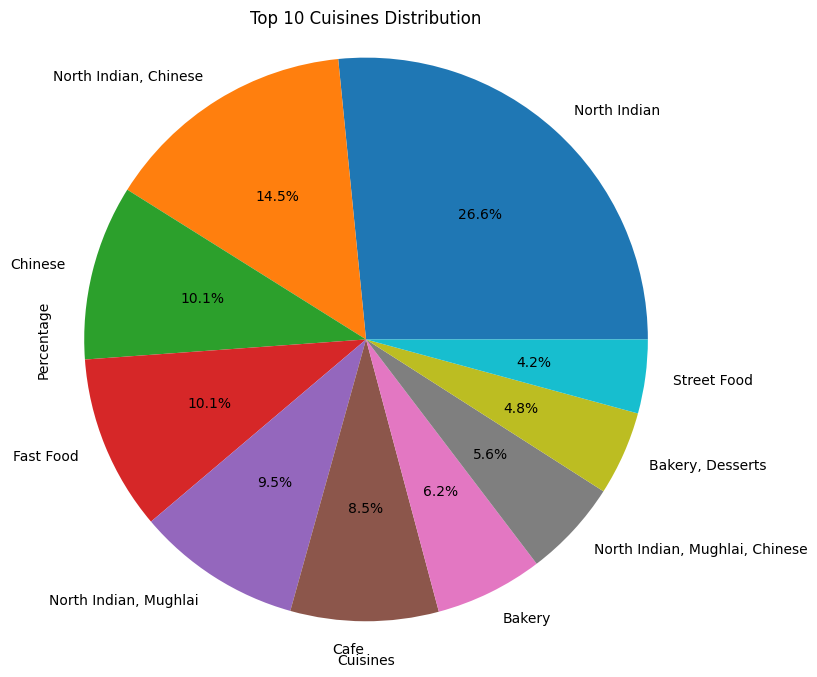

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Count top 10 cuisines
top_cuisines = df['Cuisines'].value_counts().head(10)

# Plot pie chart
plt.figure(figsize=(8, 8))
plt.pie(top_cuisines.values, labels=top_cuisines.index, autopct='%1.1f%%')
plt.title('Top 10 Cuisines Distribution')
plt.xlabel('Cuisines')
plt.ylabel('Percentage')
plt.axis('equal')
plt.savefig('Cuisines_Distribution.png')
plt.show()


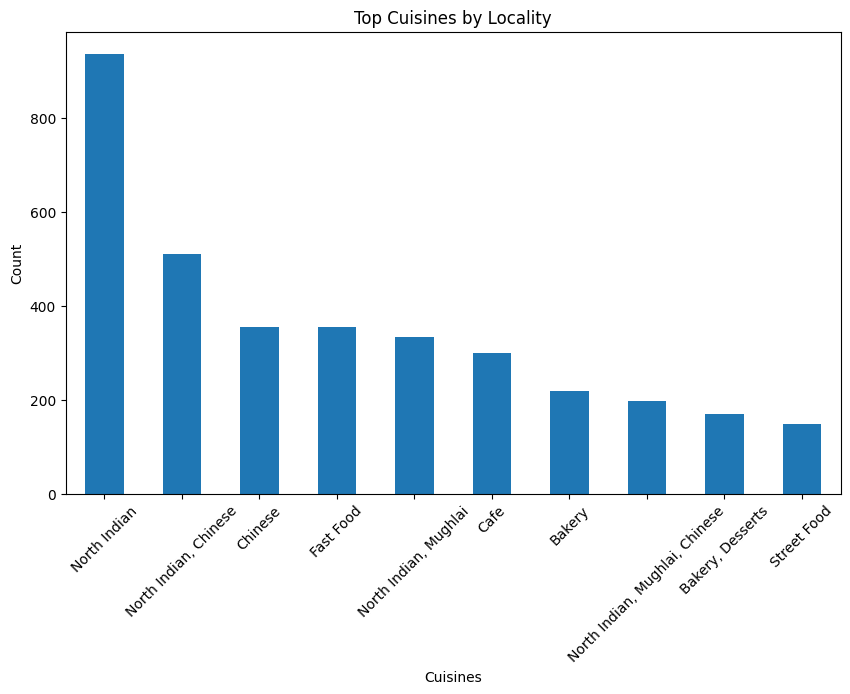

In [ ]:
top_cuisines.plot(kind='bar', figsize=(10, 6))
plt.title('Top Cuisines by Locality')
plt.xlabel('Cuisines')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.savefig('Top_Cuisines_by_Locality.png')
plt.show()

In [ ]:
# Check data types
print("Data types:\n ", df.dtypes)

Data types:
  Restaurant ID             int64
Restaurant Name          object
Country Code              int64
City                     object
Address                  object
Locality                 object
Locality Verbose         object
Longitude               float64
Latitude                float64
Cuisines                 object
Average Cost for two      int64
Currency                 object
Has Table booking        object
Has Online delivery      object
Is delivering now        object
Switch to order menu     object
Price range               int64
Aggregate rating        float64
Rating color             object
Rating text              object
Votes                     int64
dtype: object


Data Conversion

In [ ]:
# Convert 'Average Cost for two' int into float
df['Average Cost for two'] = df['Average Cost for two'].astype(float)

Analyze Target Variable

In [ ]:
# Summary Statistics
print("Summary Statistics:\n", df['Aggregate rating'].describe())

# Value Count
print("Rating distribution:\n", df['Aggregate rating'].value_counts().sort_index())

Summary Statistics:
 count    9551.000000
mean        2.666370
std         1.516378
min         0.000000
25%         2.500000
50%         3.200000
75%         3.700000
max         4.900000
Name: Aggregate rating, dtype: float64
Rating distribution:
 Aggregate rating
0.0    2148
1.8       1
1.9       2
2.0       7
2.1      15
2.2      27
2.3      47
2.4      87
2.5     110
2.6     191
2.7     250
2.8     315
2.9     381
3.0     468
3.1     519
3.2     522
3.3     483
3.4     498
3.5     480
3.6     458
3.7     427
3.8     400
3.9     335
4.0     266
4.1     274
4.2     221
4.3     174
4.4     144
4.5      95
4.6      78
4.7      42
4.8      25
4.9      61
Name: count, dtype: int64


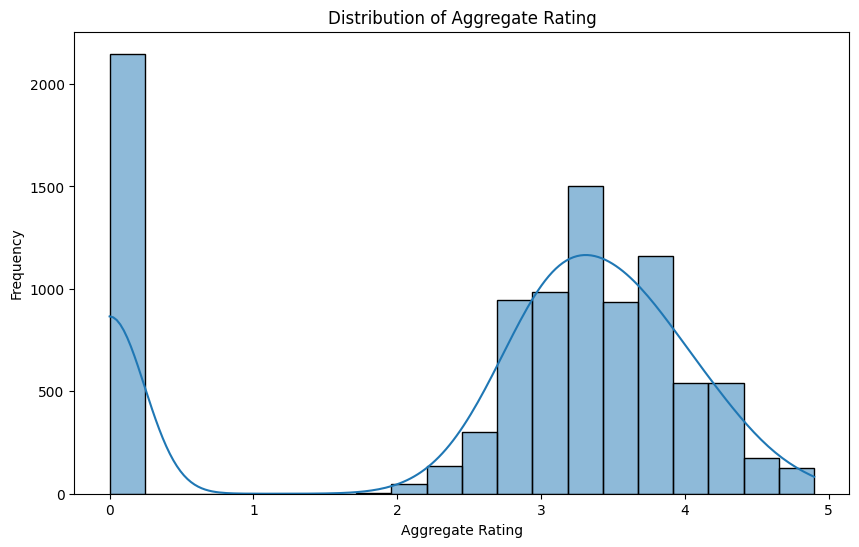

In [ ]:
plt.figure(figsize=(10, 6))
sns.histplot(df['Aggregate rating'], bins=20, kde=True)
plt.title('Distribution of Aggregate Rating')
plt.xlabel('Aggregate Rating')
plt.ylabel('Frequency')
plt.savefig('Aggregate_Rating_Distribution.png')
plt.show()

Class Imbalance Check

Class Balance:
 Rating Category
Average      3737
Good         3179
Poor         2334
Excellent     301
Name: count, dtype: int64


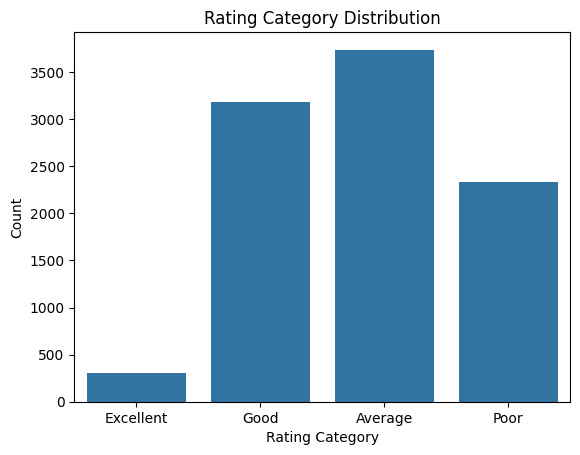

In [ ]:
# Convert Rating to Categories
def rating_category(rating):
    if rating >= 4.5:
        return 'Excellent'
    elif rating >= 3.5:
        return 'Good'
    elif rating >= 2.5:
        return 'Average'
    else:
        return 'Poor'

df['Rating Category'] = df['Aggregate rating'].apply(rating_category)

# Check class balance
class_balance = df['Rating Category'].value_counts()
print("Class Balance:\n", class_balance)

class_balance.to_excel('Class_Balance.xlsx')

sns.countplot(x='Rating Category', data=df)
plt.title('Rating Category Distribution')
plt.xlabel('Rating Category')
plt.ylabel('Count')
plt.savefig('Rating_Category_Distribution.png')
plt.show()

Task 2: Descriptive Analysis

Basic Statistical Measures for Numerical Columns

In [ ]:
# Basic statistics
numerical_cols = ['Average Cost for two', 'Price range', 'Aggregate rating', 'Votes']
stats = df[numerical_cols].describe().T
print("Basic Statistics:\n", stats)

stats.to_excel('Basic_Statistics.xlsx')


Basic Statistics:
                        count         mean           std  min    25%    50%  \
Average Cost for two  9551.0  1199.210763  16121.183073  0.0  250.0  400.0   
Price range           9551.0     1.804837      0.905609  1.0    1.0    2.0   
Aggregate rating      9551.0     2.666370      1.516378  0.0    2.5    3.2   
Votes                 9551.0   156.909748    430.169145  0.0    5.0   31.0   

                        75%       max  
Average Cost for two  700.0  800000.0  
Price range             2.0       4.0  
Aggregate rating        3.7       4.9  
Votes                 131.0   10934.0  


Numerical Statistics

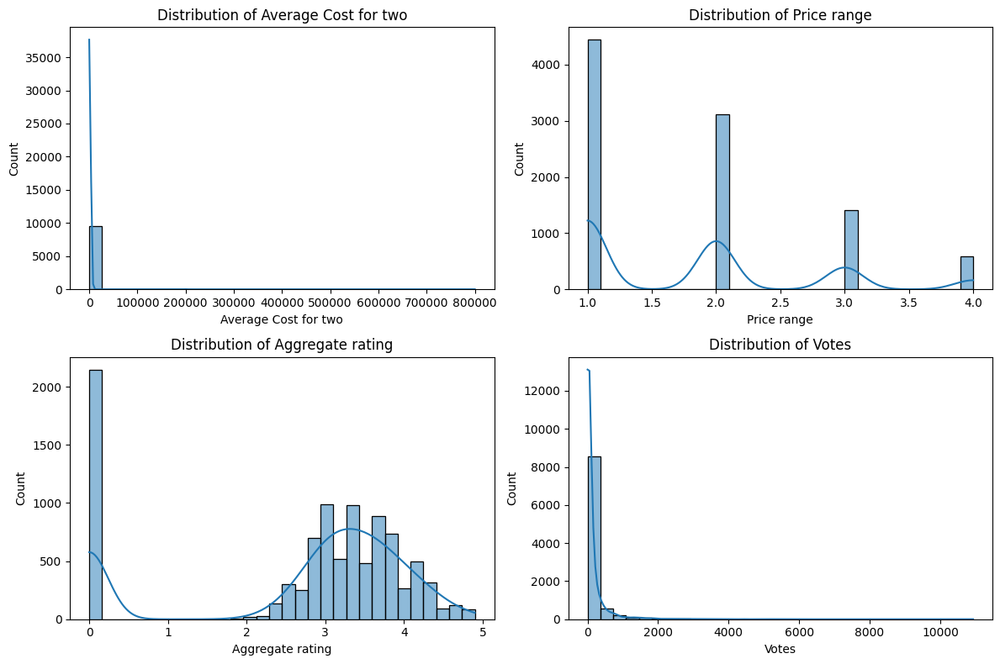

In [ ]:
# Histograms
plt.figure(figsize=(12, 8))
for i, col in enumerate(numerical_cols):
    plt.subplot(2, 2, i+1)
    sns.histplot(df[col], kde=True, bins=30)
    plt.title(f'Distribution of {col}')
plt.tight_layout()
plt.savefig('Numerical_Distributions.png')
plt.show()

Map Country Codes and Explore Categorical Distributions

In [ ]:
# Map country codes
country_map = {
    1: 'India', 14: 'Australia', 30: 'Brazil', 37: 'Canada',
    94: 'Indonesia', 148: 'New Zealand', 162: 'Philippines',
    166: 'Qatar', 184: 'Singapore', 189: 'South Africa',
    191: 'Sri Lanka', 208: 'Turkey', 214: 'UAE',
    215: 'United Kingdom', 216: 'United States'
}
df['Country'] = df['Country Code'].map(country_map)

# Categorical distributions
print("Country Distribution:\n", df['Country'].value_counts())
print("City Distribution:\n", df['City'].value_counts().head(10))
print("Cuisine Distribution:\n", df['Cuisines'].value_counts().head(10))


Country Distribution:
 Country
India             8652
United States      434
United Kingdom      80
Brazil              60
South Africa        60
UAE                 60
New Zealand         40
Turkey              34
Australia           24
Philippines         22
Indonesia           21
Qatar               20
Singapore           20
Sri Lanka           20
Canada               4
Name: count, dtype: int64
City Distribution:
 City
New Delhi       5473
Gurgaon         1118
Noida           1080
Faridabad        251
Ghaziabad         25
Bhubaneshwar      21
Lucknow           21
Ahmedabad         21
Amritsar          21
Guwahati          21
Name: count, dtype: int64
Cuisine Distribution:
 Cuisines
North Indian                      936
North Indian, Chinese             511
Chinese                           354
Fast Food                         354
North Indian, Mughlai             334
Cafe                              299
Bakery                            218
North Indian, Mughlai, Chinese    197
B

Top Cities and Cuisines by Restaurant Count

In [ ]:
# Top cities
top_cities = df['City'].value_counts().head(10)
print("Top Cities:\n", top_cities)

# Top cuisines
top_cuisines = df['Cuisines'].value_counts().head(10)
print("Top Cuisines:\n", top_cuisines)


Top Cities:
 City
New Delhi       5473
Gurgaon         1118
Noida           1080
Faridabad        251
Ghaziabad         25
Bhubaneshwar      21
Lucknow           21
Ahmedabad         21
Amritsar          21
Guwahati          21
Name: count, dtype: int64
Top Cuisines:
 Cuisines
North Indian                      936
North Indian, Chinese             511
Chinese                           354
Fast Food                         354
North Indian, Mughlai             334
Cafe                              299
Bakery                            218
North Indian, Mughlai, Chinese    197
Bakery, Desserts                  170
Street Food                       149
Name: count, dtype: int64


Country & City Distribution

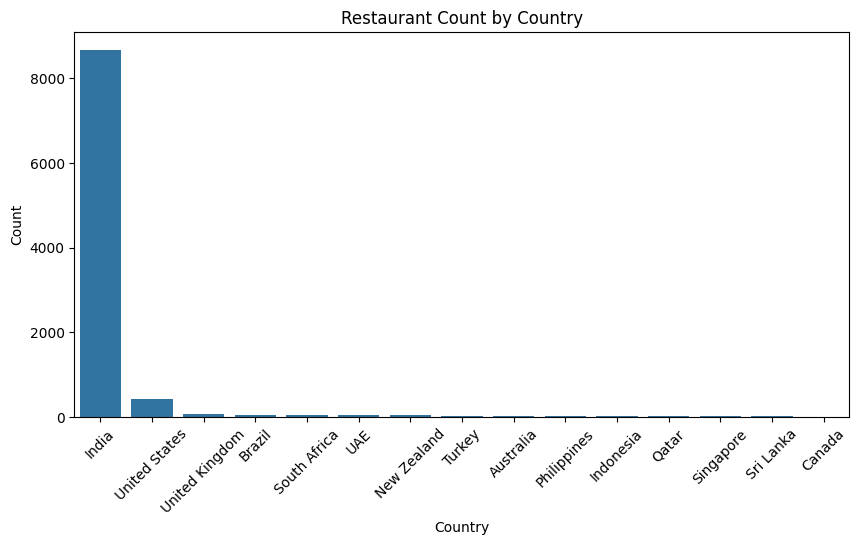

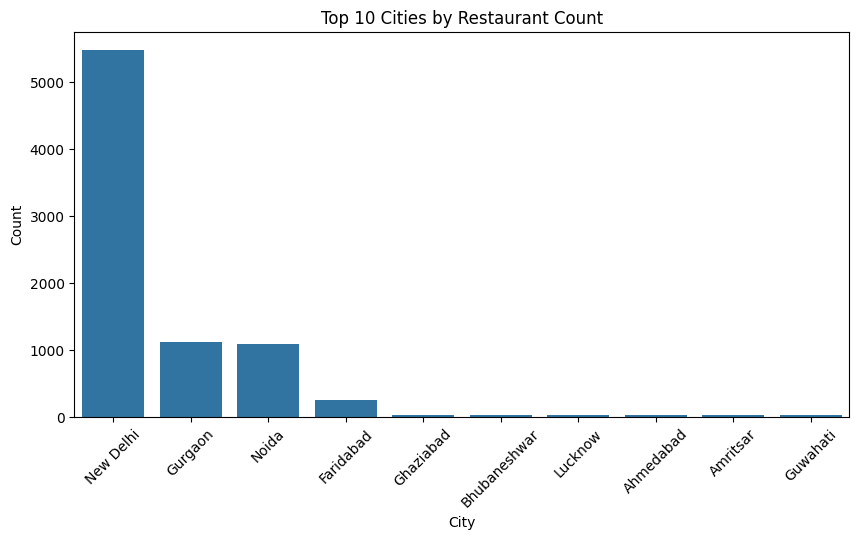

In [ ]:
# Country distribution
plt.figure(figsize=(10, 5))
country_counts = df['Country'].value_counts()
sns.barplot(x=country_counts.index, y=country_counts.values)
plt.xticks(rotation=45)
plt.title('Restaurant Count by Country')
plt.ylabel('Count')
plt.savefig('Country_Distribution.png')
plt.show()

# City distribution
plt.figure(figsize=(10, 5))
top_cities = df['City'].value_counts().head(10)
sns.barplot(x=top_cities.index, y=top_cities.values)
plt.xticks(rotation=45)
plt.title('Top 10 Cities by Restaurant Count')
plt.ylabel('Count')
plt.savefig('City_Distribution.png')
plt.show()


Cuisine Distribution

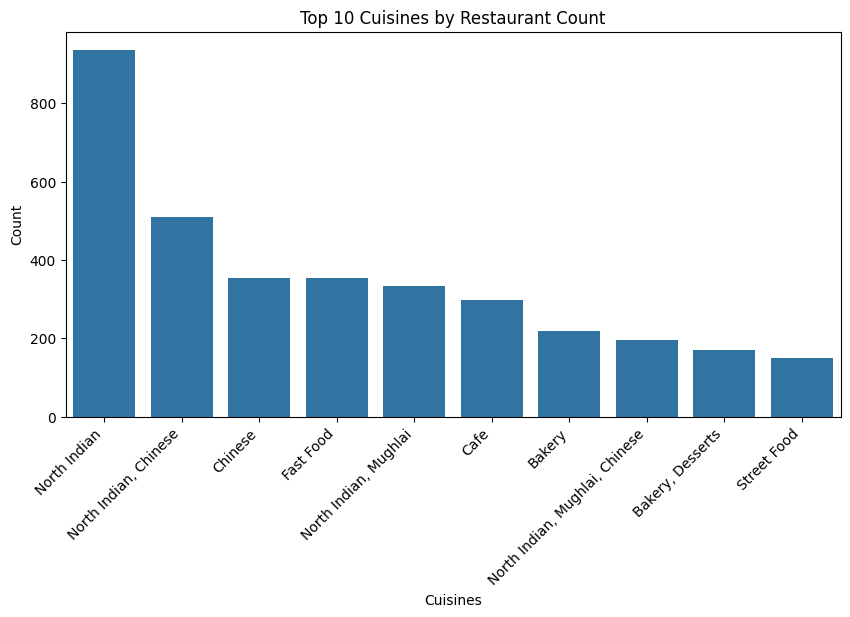

In [ ]:
# Top cuisines
plt.figure(figsize=(10, 5))
top_cuisines = df['Cuisines'].value_counts().head(10)
sns.barplot(x=top_cuisines.index, y=top_cuisines.values)
plt.xticks(rotation=45, ha='right')
plt.title('Top 10 Cuisines by Restaurant Count')
plt.ylabel('Count')
plt.savefig('Cuisine_Distribution.png')
plt.show()


Task 3:  Geospatial Analysis

In [ ]:
df[['Latitude', 'Longitude']].head()

,Latitude,Longitude
0,14.565443,121.027535
1,14.553708,121.014101
2,14.581404,121.056831
3,14.585318,121.056475
4,14.584450,121.057508


Visualize Restaurant Locations on a Map

In [ ]:
import folium
from folium.plugins import MarkerCluster

# Center the map on average  location
center_lat = df['Latitude'].mean()
center_lon = df['Longitude'].mean()

# Create base map
map = folium.Map(location=[center_lat, center_lon], zoom_start=2)

# Add markers
marker_cluster = MarkerCluster().add_to(map)
for _, row in df.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"{row['Restaurant Name']} ({row['Aggregate rating']})"
    ).add_to(marker_cluster)

# Display the map
map

In [ ]:
print(df[['Latitude', 'Longitude', 'Aggregate rating']].corr())

                  Latitude  Longitude  Aggregate rating
Latitude          1.000000   0.043207          0.000516
Longitude         0.043207   1.000000         -0.116818
Aggregate rating  0.000516  -0.116818          1.000000


Location vs Rating Analysis

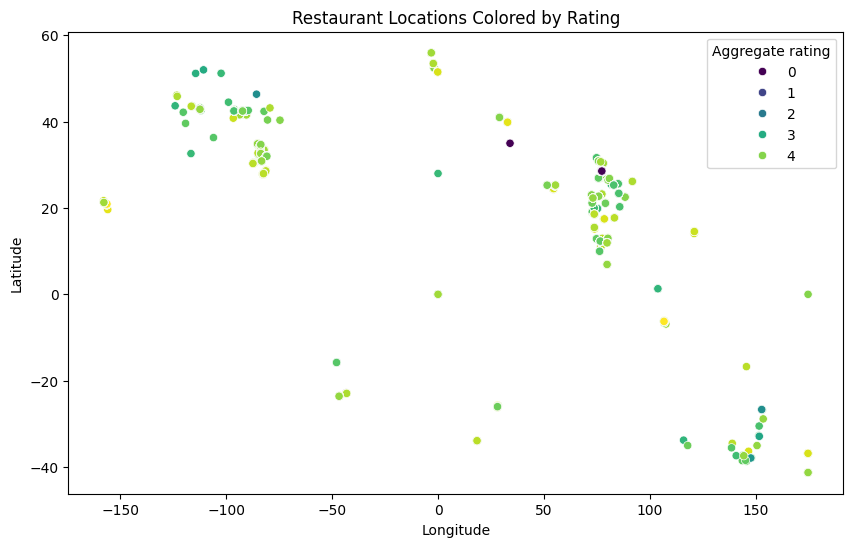

In [ ]:
# Scatter plot of location vs rating
plt.figure(figsize=(10,6))
sns.scatterplot(x='Longitude', y='Latitude', hue='Aggregate rating', data=df, palette='viridis')
plt.title("Restaurant Locations Colored by Rating")
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.savefig('Location_vs_Rating.png')
plt.show()

Rating by City

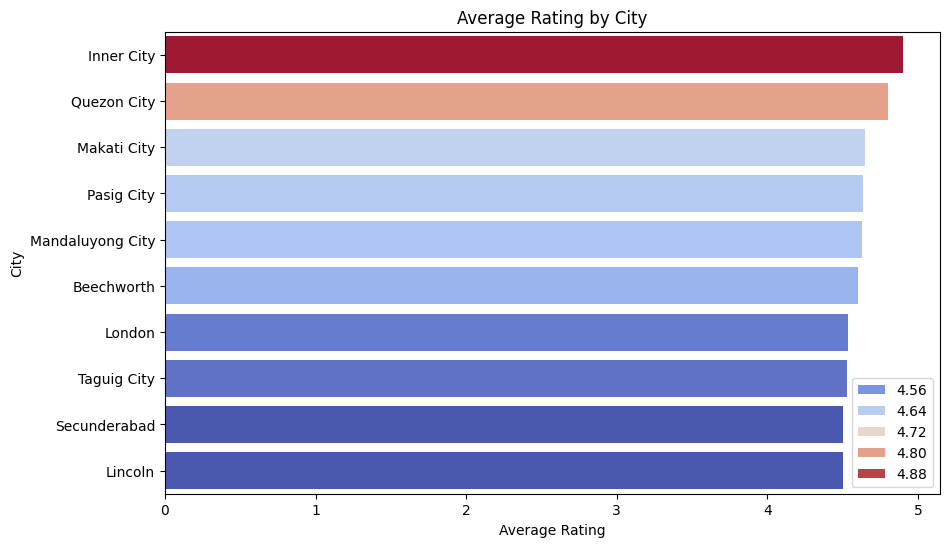

In [ ]:
city_rating = df.groupby('City')['Aggregate rating'].mean().sort_values(ascending=False).head(10)
plt.figure(figsize=(10,6))
sns.barplot(x=city_rating.values, y=city_rating.index, hue=city_rating.values, palette='coolwarm')
plt.title('Average Rating by City')
plt.xlabel('Average Rating')
plt.ylabel('City')
plt.savefig('Rating_by_City.png')
plt.show()


Geographic Correlation

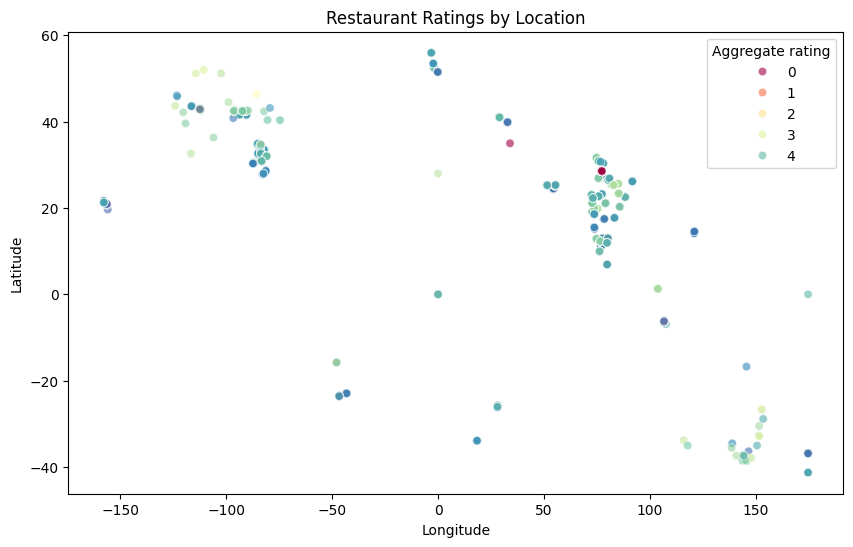

In [ ]:
# Scatter plot of location vs rating
plt.figure(figsize=(10,6))
sns.scatterplot(x='Longitude', y='Latitude', hue='Aggregate rating', data=df, palette='Spectral', alpha=0.6)
plt.title('Restaurant Ratings by Location')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.savefig('Restaurant_Ratings_by_Location.png')
plt.show()
